# Property Prices
## Contents
1. Introduction
1. Data Preparation
	1. Region and Area Separation
		1. Region
		1. Area
		1. Assigning every Area a Region
	1. Evaluating Missing Values
		1. Region Dataframe
		1. Area dataframe
1. Detached and Flat Price Trends
	1. Region vs Region
    1. Trend by Region
        1. London
        1. North East
        1. North West
        1. Yorkshire and the Humber
        1. East Midlands
        1. West Midlands
        1. East of England
        1. South East
        1. South West
        1. Per Region Summary
	1. England Overall
	1. Seasonal Pattern
	1. Trend Summary
1. Price Changes per Area
	1. Calculation
	1. Description of Price Changes
		1. Per Region
		1. Per Area
		1. Spread of Change
	1. Area Flat Price Change Summary
1. Price Change Analysis
	1. Cross-tabulation
	1. Chi-Squared
1. Conclusion

## 1. Introduction
Property prices are always on the minds of politicians and the general public alike. The biggest problem at the moment is the ability for the younger generation to purchase their first property. It is common knowledge that as a proportion of income, property prices have soared. This report intends to analyse property prices to enable decision-making on purchase locations.

The raw data contains average monthly property sale prices from September 2016 to August 2019, split into the following attributes:

Table 1: Attribute description

| Attribute | Description |
|:----------|:-----------:|
| Date | A date in the form 01/mm/yyyy |
| Area | The name of an area or region (See Table 2) |
| Code | Area code or region (See Table 2) |
| Detached | Average sale price of a **detached** property in this location in the month |
| Semi | Average sale price of a **semi-detached** property in this location in the month |
| Terraced |  Average sale price of a **terraced** property in this location in the month |
| Flat | Average sale price of a **flat** property in this location in the month |

Table 2: Area or region code explanation

| Code Prefix | Classification | Level | Description | 
|:------------|:---------------|:------|:-----------:|
| E12 | English Region | 1 | One of 9 different English regions |
| E10 | County | 2 | Local government area. Parts of a region. |
| E09 | London Borough | 2 | Local government area. Parts of a region. |
| E08 | Metropolitan Boroughs | 2 | Local government area. Parts of a region. |
| E06 | English unitary authority | 2 | Local government area. Parts of a region. |

As regions and areas overlap, it is required to separate region and area to make any valid distinction.

## 2. Data Preparation
### 2. A. Region and Area Separation

In [1]:
import pandas as pd

types_dict = {'Date': str, 'Area':'category', 'Code':str, 
              'Detached': float, 'Semi': float, 'Terraced': float, 
              'Flat': float}

houses = pd.read_csv("average-property-price.csv", dtype = types_dict)
houses = houses.assign(Month = pd.to_datetime(houses['Date'], dayfirst=True)).drop(labels='Date', axis=1)
print("Table 3: Raw Data")
houses

Table 3: Raw Data


,Area,Code,Detached,Semi,Terraced,Flat,Month
0,Hartlepool,E06000001,179323.3934,108357.4457,77192.90613,62078.20672,2016-09-01
1,Hartlepool,E06000001,178880.9745,107765.1346,76294.05974,61893.84174,2016-10-01
2,Hartlepool,E06000001,179855.0608,107886.9468,76066.73993,61909.33647,2016-11-01
3,Hartlepool,E06000001,182847.8194,109312.3743,77019.16134,62919.44401,2016-12-01
4,Hartlepool,E06000001,177454.1433,105828.3642,74522.27530,60770.80795,2017-01-01
...,...,...,...,...,...,...,...
5755,South West,E12000009,392886.0520,257833.8176,211378.14160,164580.13010,2019-04-01
5756,South West,E12000009,391955.4811,257312.3992,210797.91220,163699.89930,2019-05-01
5757,South West,E12000009,395661.8630,259252.6985,211065.78130,165268.33830,2019-06-01
5758,South West,E12000009,403181.9431,263254.4633,215997.91970,166733.18990,2019-07-01


#### 2. A. a. Region

In [2]:
print("Table 4: Raw data - region only")
houses_region = houses[houses['Code'].str.startswith('E12')].copy()
houses_region

Table 4: Raw data - region only


,Area,Code,Detached,Semi,Terraced,Flat,Month
5436,North East,E12000001,208117.1739,125683.3380,101385.68860,89361.51412,2016-09-01
5437,North East,E12000001,208519.1158,125464.3201,99998.54363,89716.48508,2016-10-01
5438,North East,E12000001,210555.4948,126082.1090,100433.81080,90065.71739,2016-11-01
5439,North East,E12000001,211728.7243,127186.0647,102150.75450,91195.50119,2016-12-01
5440,North East,E12000001,205942.7099,123088.4533,98112.30132,88170.43214,2017-01-01
...,...,...,...,...,...,...,...
5755,South West,E12000009,392886.0520,257833.8176,211378.14160,164580.13010,2019-04-01
5756,South West,E12000009,391955.4811,257312.3992,210797.91220,163699.89930,2019-05-01
5757,South West,E12000009,395661.8630,259252.6985,211065.78130,165268.33830,2019-06-01
5758,South West,E12000009,403181.9431,263254.4633,215997.91970,166733.18990,2019-07-01


#### 2. A. b. Area

In [3]:
print("Table 5: Raw data - area only")
houses_area = houses[houses['Code'].str.startswith(('E10', 'E09', 'E08', 'E06'))].copy()
houses_area

Table 5: Raw data - area only


,Area,Code,Detached,Semi,Terraced,Flat,Month
0,Hartlepool,E06000001,179323.3934,108357.4457,77192.90613,62078.20672,2016-09-01
1,Hartlepool,E06000001,178880.9745,107765.1346,76294.05974,61893.84174,2016-10-01
2,Hartlepool,E06000001,179855.0608,107886.9468,76066.73993,61909.33647,2016-11-01
3,Hartlepool,E06000001,182847.8194,109312.3743,77019.16134,62919.44401,2016-12-01
4,Hartlepool,E06000001,177454.1433,105828.3642,74522.27530,60770.80795,2017-01-01
...,...,...,...,...,...,...,...
5431,Worcestershire,E10000034,367609.8101,223579.8115,175790.42090,129009.66830,2019-04-01
5432,Worcestershire,E10000034,365271.8235,222863.2382,175373.24490,128117.93010,2019-05-01
5433,Worcestershire,E10000034,369772.6445,225435.2225,177094.03750,129593.06920,2019-06-01
5434,Worcestershire,E10000034,371129.2027,225763.4806,177371.34880,129684.34220,2019-07-01


#### 2. A. c. Assigning every Area a Region

In [4]:
location = pd.read_csv("location-codes.csv")
code_region_dict = location.set_index('AuthorityCode').to_dict()['RegionName']

unique_regions = location.loc[:, 'RegionName'].unique()

region_type = pd.CategoricalDtype(categories=unique_regions, ordered=False)

def region_maker(row):
    if row.Code in code_region_dict:
        return code_region_dict[row.Code]
    return "NaN"

houses_area_a = houses_area.assign(Region = houses_area.apply(region_maker, axis=1))
houses_area_a = houses_area_a.astype({'Region':region_type})
print("Table 6: Area data with added region attribute")
houses_area_a

Table 6: Area data with added region attribute


,Area,Code,Detached,Semi,Terraced,Flat,Month,Region
0,Hartlepool,E06000001,179323.3934,108357.4457,77192.90613,62078.20672,2016-09-01,North East
1,Hartlepool,E06000001,178880.9745,107765.1346,76294.05974,61893.84174,2016-10-01,North East
2,Hartlepool,E06000001,179855.0608,107886.9468,76066.73993,61909.33647,2016-11-01,North East
3,Hartlepool,E06000001,182847.8194,109312.3743,77019.16134,62919.44401,2016-12-01,North East
4,Hartlepool,E06000001,177454.1433,105828.3642,74522.27530,60770.80795,2017-01-01,North East
...,...,...,...,...,...,...,...,...
5431,Worcestershire,E10000034,367609.8101,223579.8115,175790.42090,129009.66830,2019-04-01,West Midlands
5432,Worcestershire,E10000034,365271.8235,222863.2382,175373.24490,128117.93010,2019-05-01,West Midlands
5433,Worcestershire,E10000034,369772.6445,225435.2225,177094.03750,129593.06920,2019-06-01,West Midlands
5434,Worcestershire,E10000034,371129.2027,225763.4806,177371.34880,129684.34220,2019-07-01,West Midlands


Here we can see the Hartlepool is indeed in the North East and Worcestershire in the West Midlands (Table 6).

In [5]:
import random
print("Table 7: Randomly selected Table 6 entries")
random_list = [random.randint(-1, 5437) for a in range(12)]

houses_area_a.loc[random_list, ["Area", "Region"]]

Table 7: Randomly selected Table 6 entries


,Area,Region
1685,County Durham,North East
512,City of Derby,East Midlands
3611,Enfield,London
479,York,Yorkshire and The Humber
3188,Leeds,Yorkshire and The Humber
4052,Lambeth,London
4031,Kingston upon Thames,London
2671,Newcastle upon Tyne,North East
2647,Sheffield,Yorkshire and The Humber
1605,Southampton,South East


To check that other areas have been assigned correctly, rows of the dataframe were drawn at random and a visual check was done (Table 7).

To check that every area has a region assigned, the output below (Table 8) shows any unassigned values. There are none, so all areas have been assigned a region.

In [6]:
print("Table 8: Missing values from combined dataframe (Table 6)")
houses_area_a.loc[(houses_area_a.Area.isnull()) | (houses_area_a.Region.isnull())]

Table 8: Missing values from combined dataframe (Table 6)


,Area,Code,Detached,Semi,Terraced,Flat,Month,Region


### 2. B. Evaluating missing values
#### 2. B. a. Region Dataframe
The text below shows a summary of the region dataframe, any inconsistencies suggest a missing value. It is visible that every attribute has 324 non-null values, which means that every attribute has values for every region.

In [7]:
print("Count summary of the Region Dataframe")
houses_region.info()

Count summary of the Region Dataframe
<class 'pandas.core.frame.DataFrame'>
Int64Index: 324 entries, 5436 to 5759
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Area      324 non-null    category      
 1   Code      324 non-null    object        
 2   Detached  324 non-null    float64       
 3   Semi      324 non-null    float64       
 4   Terraced  324 non-null    float64       
 5   Flat      324 non-null    float64       
 6   Month     324 non-null    datetime64[ns]
dtypes: category(1), datetime64[ns](1), float64(4), object(1)
memory usage: 23.7+ KB


#### 2. B. b. Area dataframe
The text below shows a summary of the area dataframe, any inconsistencies suggest a missing value. It is visible that the Detached, Semi and Terraced attributes have different non-null values, which means that these attributes have missing values (Table 9). Looking more specifically, the values are all missing from the City of London area: detached, semi-detached and terraced properties. The most logical reason for this is that City of London properties in the detached, semi or terraced properties are rarely sold or that the detached and semi properties do not exist there. 

In [8]:
print("Count summary of the Area Dataframe")
houses_area_a.info()

Count summary of the Area Dataframe
<class 'pandas.core.frame.DataFrame'>
Int64Index: 5436 entries, 0 to 5435
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Area      5436 non-null   category      
 1   Code      5436 non-null   object        
 2   Detached  5400 non-null   float64       
 3   Semi      5400 non-null   float64       
 4   Terraced  5416 non-null   float64       
 5   Flat      5436 non-null   float64       
 6   Month     5436 non-null   datetime64[ns]
 7   Region    5436 non-null   category      
dtypes: category(2), datetime64[ns](1), float64(4), object(1)
memory usage: 447.9+ KB


In [9]:
print("Table 9: Missing data in area data")
houses_area_a.loc[(houses_area_a.Detached.isnull()) | (houses_area_a.Semi.isnull()) | 
                  (houses_area_a.Terraced.isnull())]

Table 9: Missing data in area data


,Area,Code,Detached,Semi,Terraced,Flat,Month,Region
3276,City of London,E09000001,NaN,NaN,1189233.714,777891.9778,2016-09-01,London
3277,City of London,E09000001,NaN,NaN,1195010.116,790055.2118,2016-10-01,London
3278,City of London,E09000001,NaN,NaN,1229507.612,815992.8991,2016-11-01,London
3279,City of London,E09000001,NaN,NaN,1217012.801,809149.8515,2016-12-01,London
3280,City of London,E09000001,NaN,NaN,1227434.570,817654.0898,2017-01-01,London
3281,City of London,E09000001,NaN,NaN,1189660.065,818093.5200,2017-02-01,London
3282,City of London,E09000001,NaN,NaN,1176573.144,851416.0699,2017-03-01,London
3283,City of London,E09000001,NaN,NaN,1238739.417,903551.8492,2017-04-01,London
3284,City of London,E09000001,NaN,NaN,1277795.874,937307.4240,2017-05-01,London
3285,City of London,E09000001,NaN,NaN,1174213.336,928316.5022,2017-06-01,London


It would be inappropriate to fill these values with an average because that would indicate that something was sold in that month, which it was not. Furthermore, these property types of this area will not be explored in this report so there is no need to synthesise values for analysis. However, if I did intend to use these values, I would replace them with the median of their respective attribute, rather than the mean, as they are positively skewed (Figure 1).

Figure 1: Boxplot of the spread of different building types


Text(0.5, 0.98, 'Spread of Prices per Attribute')

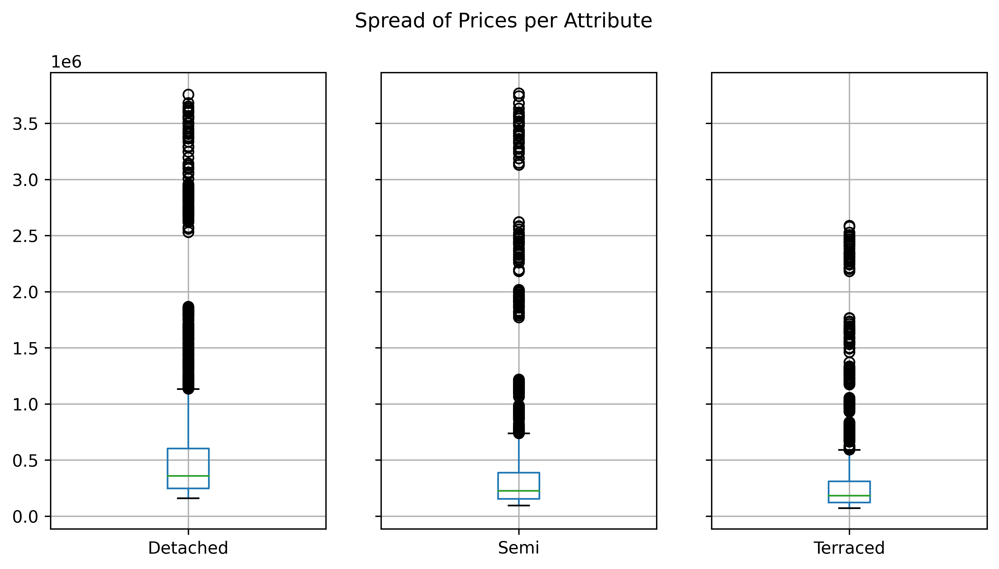

In [42]:
import matplotlib.pyplot as plt
print("Figure 1: Boxplot of the spread of different building types")
fig, (a1, a2, a3) = plt.subplots(1,3, dpi=600, figsize=(10,5), sharey=True)
houses_area_a.boxplot(column='Detached', ax=a1)
houses_area_a.boxplot(column='Semi', ax=a2)
houses_area_a.boxplot(column='Terraced', ax=a3)
fig.suptitle('Spread of Prices per Attribute')

## 3. Detached and Flat Price Trends
### 3. A. Region vs Region

Figure 2: Graph showing Flat and Detached property prices between regions from September 2016 to August 2019


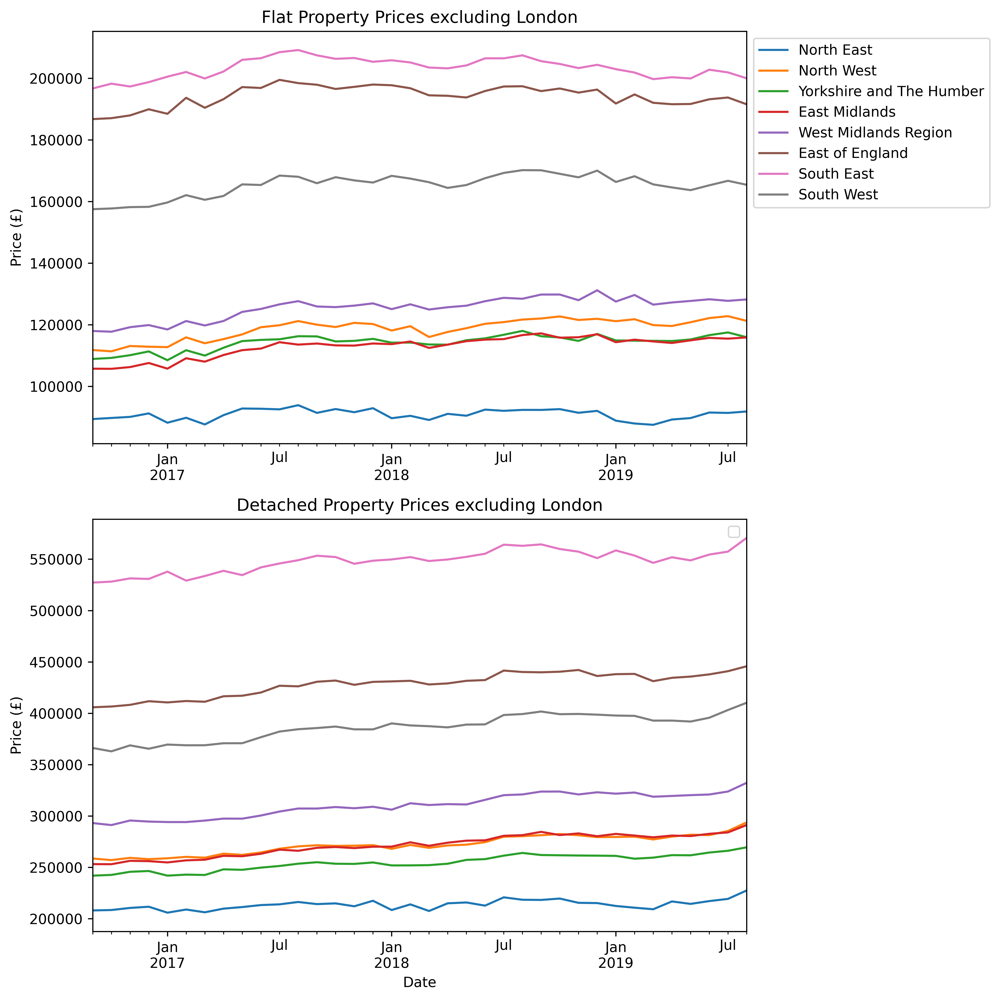

In [11]:


gbyRegion = houses_region.groupby(by = 'Area', dropna=False)

north_east = gbyRegion.get_group('North East')
north_west = gbyRegion.get_group('North West')
york = gbyRegion.get_group('Yorkshire and The Humber')
east_mid = gbyRegion.get_group('East Midlands')
west_mid = gbyRegion.get_group('West Midlands Region')
east_eng = gbyRegion.get_group('East of England')
lond = gbyRegion.get_group('London')
south_east = gbyRegion.get_group('South East')
south_west = gbyRegion.get_group('South West')

print("Figure 2: Graph showing Flat and Detached property prices between regions from September 2016 to August 2019")
## Flats

prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1, a2) = plt.subplots(2,1, dpi=600, figsize=(10,10))

north_east.plot(x = "Month", y = prop_type1, label='North East', ax=a1)
north_west.plot(x = "Month", y = prop_type1, label='North West', ax=a1)
york.plot(x = "Month", y = prop_type1, label='Yorkshire and The Humber', ax=a1)
east_mid.plot(x = "Month", y = prop_type1, label='East Midlands',  ax=a1)
west_mid.plot(x = "Month", y = prop_type1, label='West Midlands Region', ax=a1)
east_eng.plot(x = "Month", y = prop_type1, label='East of England', ax=a1)
south_east.plot(x = "Month", y = prop_type1, label='South East', ax=a1)
south_west.plot(x = "Month", y = prop_type1, label='South West', ax=a1)

a1.set_title(prop_type1 + " Property Prices excluding London")
a1.set_xlabel('')
a1.set_ylabel('Price (£)')
a1.legend(bbox_to_anchor=(1, 1))


## Detached
north_east.plot(x = "Month", y = prop_type2, label='North East', ax=a2)
north_west.plot(x = "Month", y = prop_type2, label='North West', ax=a2)
york.plot(x = "Month", y = prop_type2, label='Yorkshire and The Humber', ax=a2)
east_mid.plot(x = "Month", y = prop_type2, label='East Midlands',  ax=a2)
west_mid.plot(x = "Month", y = prop_type2, label='West Midlands Region', ax=a2)
east_eng.plot(x = "Month", y = prop_type2, label='East of England', ax=a2)
south_east.plot(x = "Month", y = prop_type2, label='South East', ax=a2)
south_west.plot(x = "Month", y = prop_type2, label='South West', ax=a2)

a2.set_title(prop_type2 + " Property Prices excluding London")
a2.set_xlabel('Date')
a2.set_ylabel('Price (£)')
a2.legend('')

fig.tight_layout()

From Figure 2, it is visible that the South East was the most expensive (after London - see Figure 3) and the North East was the cheapest in both Flat and Detached properties. Furthermore, it was approximately the same price for a Flat in the South East as it was a Detached property in the North East. It is also visible that the order of expensive to cheap regions was roughly maintained over 3 years for both property types, apart from the North West, Yorkshire and the Humber, and the East Midlands which were in different orders in either property types. Overall, it looks like all regions  slowly increased in Flat price, apart from the South East and East of England, but Detached prices stayed roughly the same.

### 3. B. Trend by Region

#### 3. B. a. London

Figure 3: Graph showing Flat and Detached property prices in London from September 2016 to August 2019


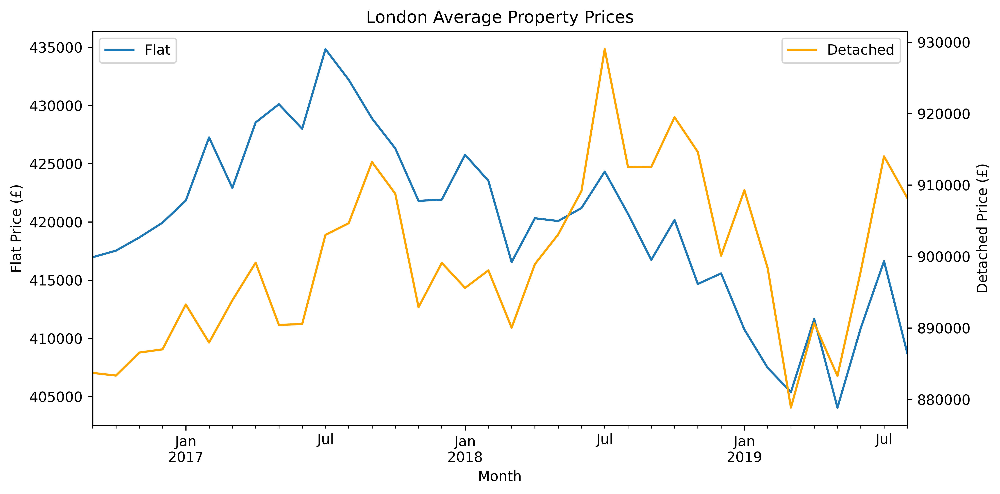

In [12]:
print("Figure 3: Graph showing Flat and Detached property prices in London from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
lond.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
lond.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("London Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

London was excluded from the previous figure as property prices in London were significantly dearer than the rest of the regions. Flats and Detached properties were nearly double the price of the South East region and nearly quadruple the North East respectively. Unlike other regions, Flats in London became less expensive from July 2017, and March 2019 was the cheapest month for Detached properties over the three-year period. Although Detached houses were almost always nearly double the price of flats in London, both property types peaked around the same time (July - September), but throughout the years, prices in London were very volatile for both property types.

#### 3. B. b. North East

Figure 4: Chart showing Flat and Detached property prices in North East from September 2016 to August 2019


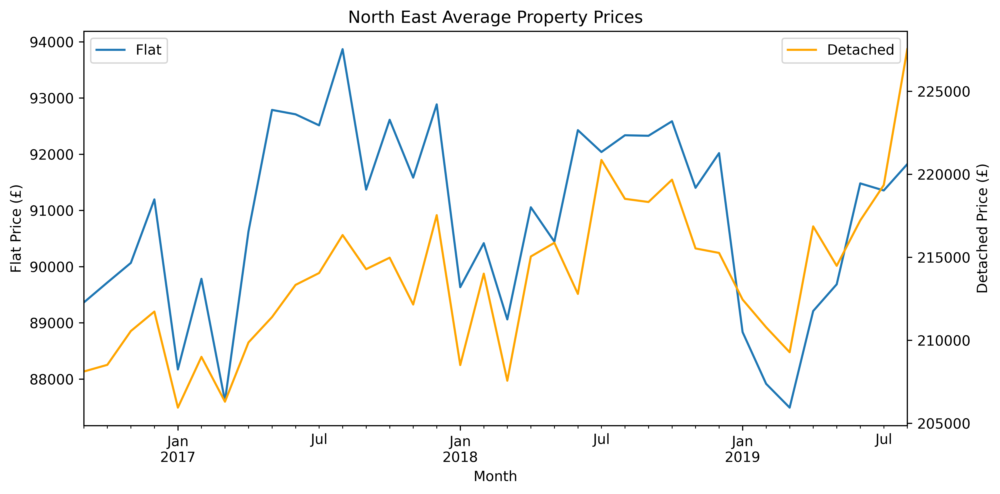

In [13]:
print("Figure 4: Chart showing Flat and Detached property prices in North East from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
north_east.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
north_east.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("North East Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

The North East figure generally maintained the same Flat price over the three years, with both properties dipping in January to March. The shape of the trend for Flats and Detached properties in the North East was similar. Detached prices tended to increase although month to month prices were very volatile.

#### 3. B. c. North West

Figure 5: Graph showing Flat and Detached property prices in North West from September 2016 to August 2019


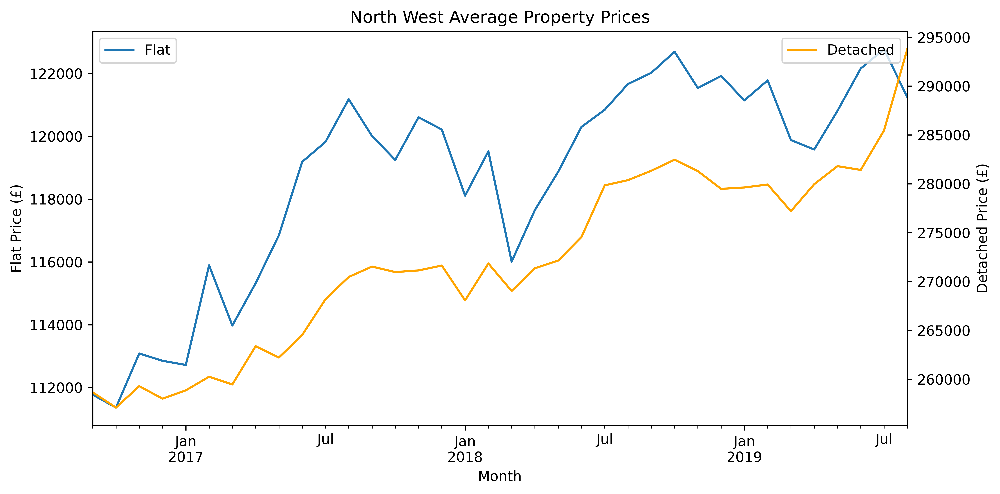

In [14]:
print("Figure 5: Graph showing Flat and Detached property prices in North West from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
north_west.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
north_west.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("North West Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached and Flat property prices in the North West tended to increase relatively equally over the three years, with less dipped months than the North East.

#### 3. B. d. Yorkshire and the Humber

Figure 6: Graph showing Flat and Detached property prices in Yorkshire and the Humber from September 2016 to August 2019


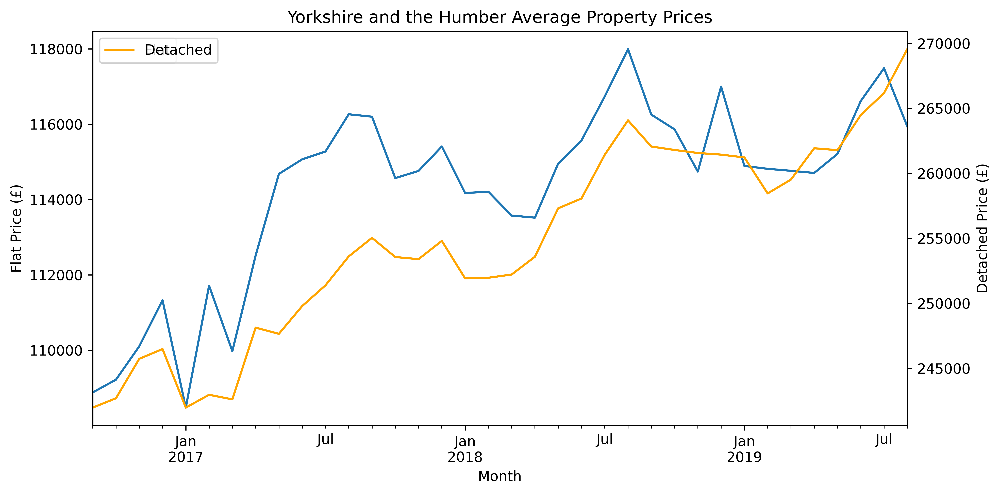

In [15]:
print("Figure 6: Graph showing Flat and Detached property prices in Yorkshire and the Humber from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
york.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
york.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("Yorkshire and the Humber Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached and Flat property prices in Yorkshire and the Humber tended to increase relatively equally over the three years, with only small dips throughout the year, but large peaks around July.

#### 3. B. e. East Midlands

Figure 7: Graph showing Flat and Detached property prices in East Midlands from September 2016 to August 2019


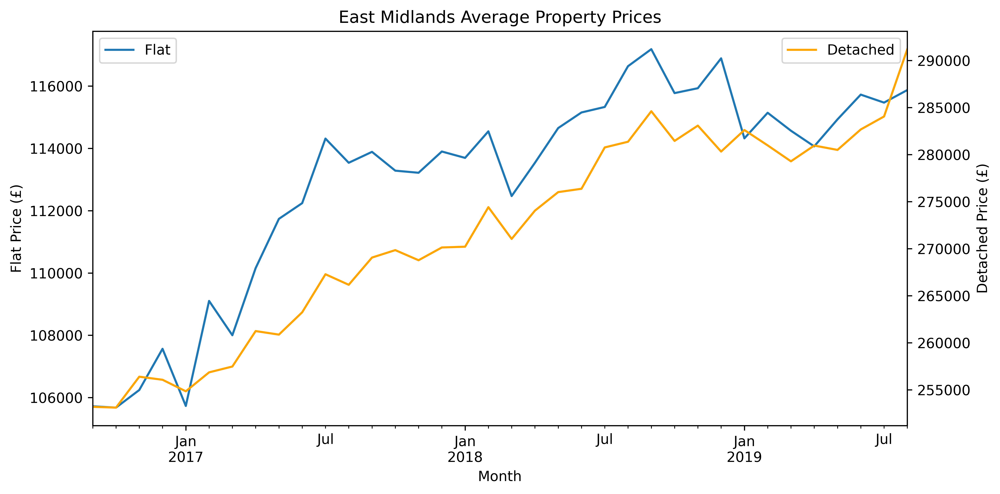

In [16]:
print("Figure 7: Graph showing Flat and Detached property prices in East Midlands from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
east_mid.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
east_mid.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("East Midlands Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached and Flat property prices in the East Midlands tended to increase relatively equally over the three years. 
Seasonal peaks and troughs were generally not visible at all on Detached properties, but flats did dip around February to March.

#### 3. B. f. West Midlands

Figure 8: Graph showing Flat and Detached property prices in West Midlands from September 2016 to August 2019


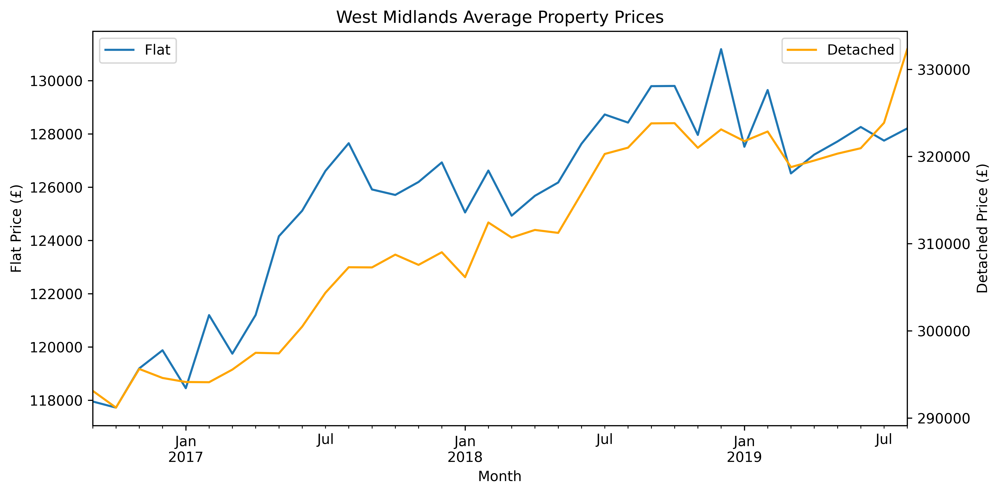

In [17]:
print("Figure 8: Graph showing Flat and Detached property prices in West Midlands from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
west_mid.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
west_mid.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("West Midlands Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached and Flat property prices in the West Midlands tended to increase relatively equally over the three years. Dips were generally not visible at all on Detached properties, but flats did dip around January to March.

#### 3. B. g. East of England

Figure 9: Graph showing Flat and Detached property prices in the East of England from September 2016 to August 2019


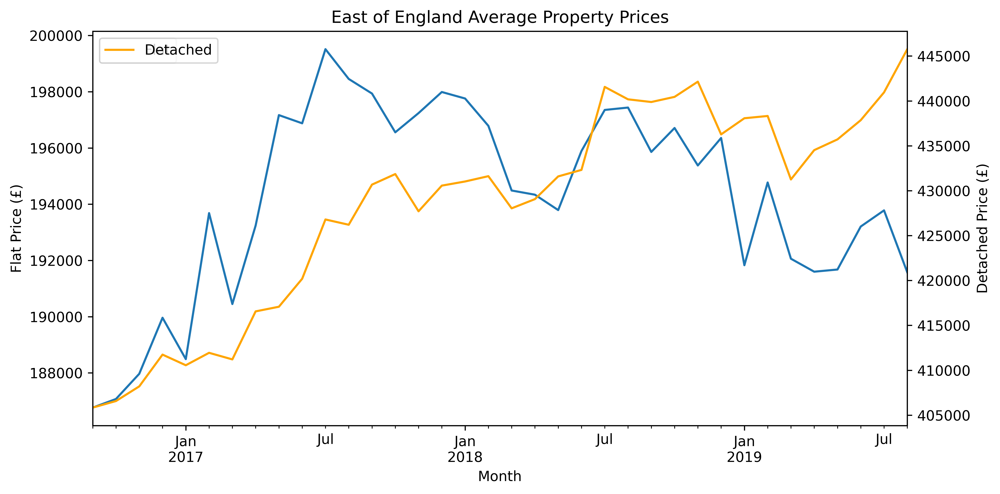

In [18]:
print("Figure 9: Graph showing Flat and Detached property prices in the East of England from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
east_eng.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
east_eng.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("East of England Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached property prices in the East of England tended to increase over the three years with both property types dipping in January to March. Flat prices peaked in July 2017, and since then have been decreasing.

#### 3. B. h. South East

Figure 10: Graph showing Flat and Detached property prices in the South East from September 2016 to August 2019


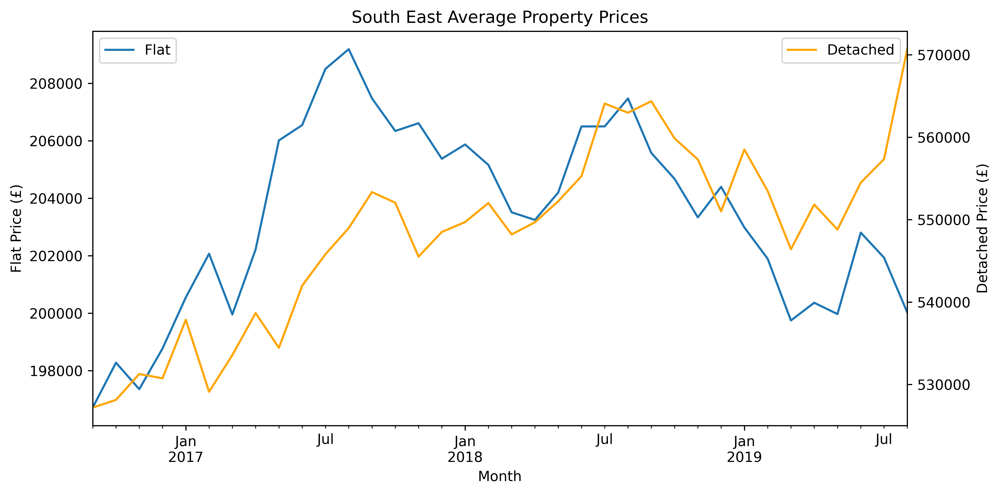

In [19]:
print("Figure 10: Graph showing Flat and Detached property prices in the South East from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
south_east.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
south_east.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("South East Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached property prices in the South East tended to increase over the three years with both property types dipping in January to March. Flat prices peaked in July 2017, and since then have been decreasing.

#### 3. B. i. South West

Figure 11: Graph showing Flat and Detached property prices in the South West from September 2016 to August 2019


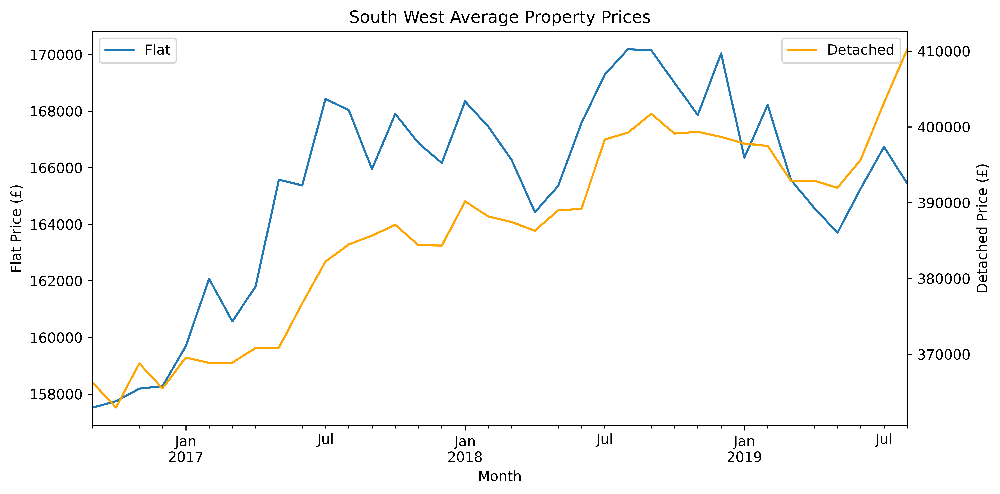

In [20]:
print("Figure 11: Graph showing Flat and Detached property prices in the South West from September 2016 to August 2019")
prop_type1 = "Flat"
prop_type2 = "Detached"
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,5))
south_west.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)
a2 = a1.twinx()
south_west.plot(x = "Month", y = prop_type2, label=prop_type2, color='orange', ax=a2)

a1.set_title("South West Average Property Prices")
a1.set_xlabel('Month')
a1.set_ylabel('Flat Price (£)')
a1.legend(loc="upper left")

a2.set_ylabel('Detached Price (£)')

fig.tight_layout()

Detached property prices in the South West tended to increase over the three years with both property types dipping in March to April - later than other regions. Flat prices peaked in July 2017, and since then maintained a similar price (given seasonal variations), given that Flat prices in the South West are more volatile than Flat prices.

#### 3. B. j. Per Region Summary

* London and the North East were the most volatile for both property types.
* Generally in both property types, all regions dipped around January to March, apart from the South West which dipped later.
* North East, South East and London Flat prices generally reduced from the peak in July 2017. The south west maintained prices since July 2017 and other regions generally increased.

### 3. C. England Overall

Figure 12: Graph showing Flat and Detached property prices in England from September 2016 to August 2019


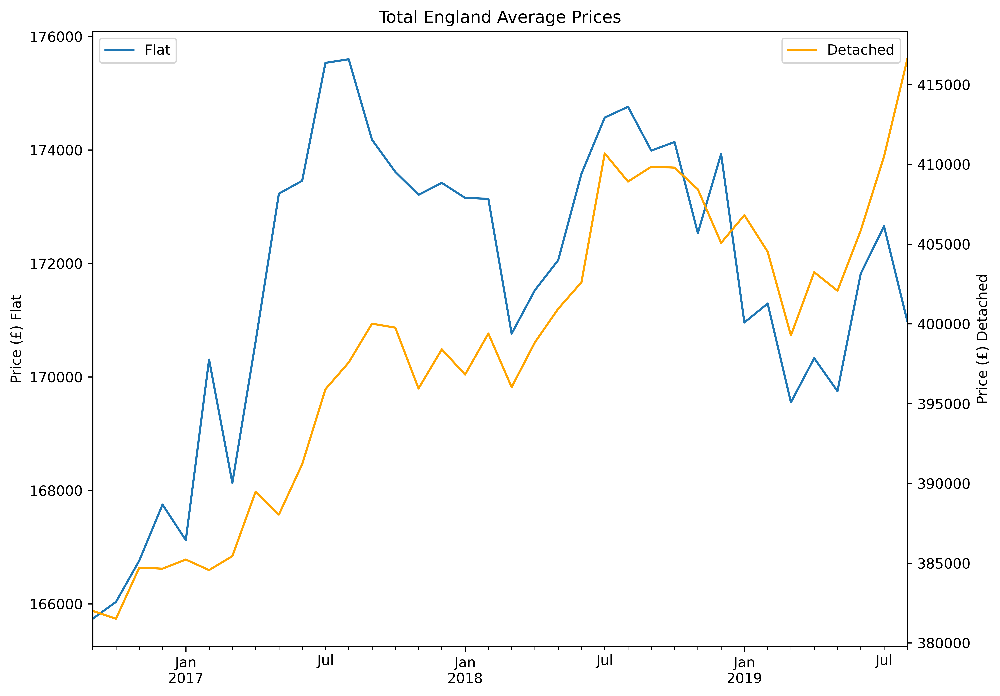

In [21]:
print("Figure 12: Graph showing Flat and Detached property prices in England from September 2016 to August 2019")
houses_region_combined = houses_region.groupby('Month').agg({'Flat': 'mean', 'Detached': 'mean'}).reset_index()

prop_type1 = "Flat"
prop_type2 = "Detached"

fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,7))
houses_region_combined.plot(x = "Month", y = prop_type1, label=prop_type1, ax=a1)

a2 = a1.twinx()
houses_region_combined.plot(x = "Month", y = prop_type2, label=prop_type2, color="orange", ax=a2)

a1.set_title("Total England Average Prices")
a1.set_xlabel('')
a1.set_ylabel('Price (£) Flat')
a1.legend(loc='upper left')

a2.set_ylabel('Price (£) Detached')
a2.legend(loc='upper right')

fig.tight_layout()

Figure 12 shows the overall mean average of England prices. Detached prices did not peak as relatively sharply as Flats in March to August 2017, however, peaks and troughs relatively follow each other with Detached lagging behind (caused by the data from London, East of England and South West). It looks like Flat prices are increasing year on year, but Detached prices fail to exceed the previous peak of August 2017. Be advised this is a generalisation of the whole country, most regions peaked in flat prices in Summer 2017, but only the South East, East of England, North East and London did not return or exceed this value for the rest of the years.

### 3. D. Seasonal Pattern

In [22]:
type_dict = {'Month':str}

#### 2016
twenty_16 = houses_region_combined.loc[(houses_region_combined['Month'] >= '2016/09/01') & (houses_region_combined['Month'] < '2017/01/01')]
twenty_16 = twenty_16.astype(type_dict)

month_d = {'2016-09-01':9, '2016-10-01':10, '2016-11-01':11, '2016-12-01':12}

def simp_month(row):
    if row.Month in month_d:
        return month_d[row.Month]
    return row.Month

twent_16 = twenty_16.assign(Month_no = twenty_16.apply(simp_month, axis=1))
twent_16 = twent_16.drop(labels=['Month'], axis=1)
twent_16 = twent_16.sort_values(by='Month_no')

## 2017
twenty_17 = houses_region_combined.loc[(houses_region_combined['Month'] >= '2017/01/01') & (houses_region_combined['Month'] < '2018/01/01')]
twenty_17 = twenty_17.astype(type_dict)

month_d_17 = {'2017-01-01':1, '2017-02-01':2, '2017-03-01':3, '2017-04-01':4, '2017-05-01':5,
              '2017-06-01':6, '2017-07-01':7, '2017-08-01':8, '2017-09-01':9, '2017-10-01':10,
              '2017-11-01':11, '2017-12-01':12}

def simp_month_17(row):
    if row.Month in month_d_17:
        return month_d_17[row.Month]
    return row.Month

twent_17 = houses_region_combined.assign(Month_no = twenty_17.apply(simp_month_17, axis=1))
twent_17 = twent_17.drop(labels=['Month'], axis=1)
twent_17 = twent_17.sort_values(by='Month_no')


## 2018
twenty_18 = houses_region_combined.loc[(houses_region_combined['Month'] >= '2018/01/01') & (houses_region_combined['Month'] < '2019/01/01')]
twenty_18 = twenty_18.astype(type_dict)

month_d_18 = {'2018-01-01':1, '2018-02-01':2, '2018-03-01':3, '2018-04-01':4, '2018-05-01':5,
              '2018-06-01':6, '2018-07-01':7, '2018-08-01':8, '2018-09-01':9, '2018-10-01':10,
              '2018-11-01':11, '2018-12-01':12}

def simp_month_18(row):
    if row.Month in month_d_18:
        return month_d_18[row.Month]
    return row.Month

twent_18 = twenty_18.assign(Month_no = twenty_18.apply(simp_month_18, axis=1))
twent_18 = twent_18.drop(labels=['Month'], axis=1)
twent_18 = twent_18.sort_values(by='Month_no')

## 2019
twenty_19 = houses_region_combined.loc[(houses_region_combined['Month'] >= '2019/01/01') & (houses_region_combined['Month'] < '2019/09/01')]
twenty_19 = twenty_19.astype(type_dict)

month_d_19 = {'2019-01-01':1, '2019-02-01':2, '2019-03-01':3, '2019-04-01':4, '2019-05-01':5,
             '2019-06-01':6, '2019-07-01':7, '2019-08-01':8}

def simp_month_19(row):
    if row.Month in month_d_19:
        return month_d_19[row.Month]
    return row.Month

twent_19 = twenty_19.assign(Month_no = twenty_19.apply(simp_month_19, axis=1))
twent_19 = twent_19.drop(labels=['Month'], axis=1)
twent_19 = twent_19.sort_values(by='Month_no')

Figure 13: Graph showing Flat and Detached property prices in England from September 2016 to August 2019 per year


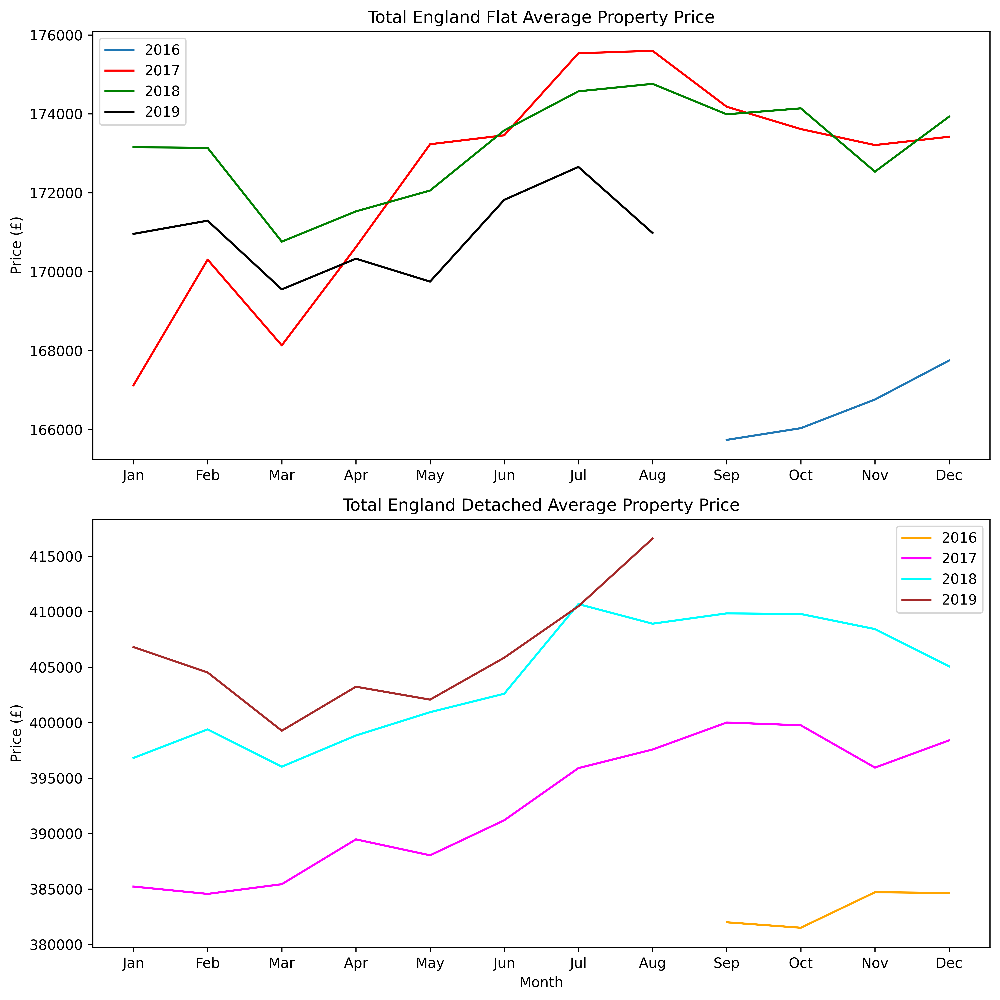

In [23]:
print("Figure 13: Graph showing Flat and Detached property prices in England from September 2016 to August 2019 per year")

prop_type1 = "Flat"
prop_type2 = "Detached"

selected=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
xlist = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

fig, (a1, a2) = plt.subplots(2,1, dpi=600, figsize=(10,10))
twent_16.plot(x = "Month_no", y = prop_type1, label="2016", ax=a1)
twent_17.plot(x = "Month_no", y = prop_type1, label="2017", color='red', ax=a1)
twent_18.plot(x = "Month_no", y = prop_type1, label="2018", color='green', ax=a1)
twent_19.plot(x = "Month_no", y = prop_type1, label="2019", color='black', ax=a1)


twent_16.plot(x = "Month_no", y = prop_type2, label="2016", color="orange", ax=a2)
twent_17.plot(x = "Month_no", y = prop_type2, label="2017", color="magenta", ax=a2)
twent_18.plot(x = "Month_no", y = prop_type2, label="2018", color="cyan", ax=a2)
twent_19.plot(x = "Month_no", y = prop_type2, label="2019", color="brown", ax=a2)

a1.set_title("Total England Flat Average Property Price")
a1.set_xlabel('')
a1.set_ylabel('Price (£)')
a1.set_xticks(selected)
a1.set_xticklabels(xlist)

a2.set_title("Total England Detached Average Property Price")
a2.set_ylabel('Price (£)')
a2.set_xlabel('Month')
a2.set_xticks(selected)
a2.set_xticklabels(xlist)

fig.tight_layout()

From Figure 13, a general seasonal trend can be established. Flats had the highest prices in July to August and Detached peaked in September to October. March to April had the lowest price in every year for Flats, compared to that of Detached prices which dipped in December to March. Flat prices were also more volatile, whereas Detached prices were more gradual, in a sense that high prices of Flat quickly reduced the month after, whereas Detached maintained a high price for a few months.

### 3. E. Trend Summary
* London was the most expensive region and the North East was the least expensive region for both Flats and Detached properties.
* All regions dipped early in the year, but the South West dipped later than other regions.
* Detached prices tended to increase but flat prices tended to decrease (from summer 2017).
* Flat and Detached prices peaked at roughly the same time, but Detached peaked later than Flats and maintained a high price for longer.

## 4. Price Changes per Area
All areas may have changed prices between years. The following will calculate the change the prices of Flats between July 2017 to July 2018 across all England areas.

### 4. A. Calculation

First, July 2017 with the prices of 151 areas listed (Table 10).

In [24]:
print("Table 10: July 2017 Prices")
houses_area_17 = houses_area_a.loc[(houses_area_a['Month'] == '2017/07/01')].reset_index()
houses_area_17

Table 10: July 2017 Prices


,index,Area,Code,Detached,Semi,Terraced,Flat,Month,Region
0,10,Hartlepool,E06000001,186030.1497,112168.0127,79436.27053,65007.84170,2017-07-01,North East
1,46,Middlesbrough,E06000002,187695.9901,111107.0273,79505.65683,69163.06963,2017-07-01,North East
2,82,Redcar and Cleveland,E06000003,187618.3790,117895.4611,89473.56935,65507.80990,2017-07-01,North East
3,118,Stockton-on-Tees,E06000004,210016.6510,123232.6999,95599.36140,83599.32806,2017-07-01,North East
4,154,Darlington,E06000005,227479.6970,136030.9295,102533.59940,87041.37973,2017-07-01,North East
...,...,...,...,...,...,...,...,...,...
146,5266,Suffolk,E10000029,353962.6700,222352.9988,181134.70370,140278.18370,2017-07-01,East of England
147,5302,Surrey,E10000030,786923.8580,455596.0847,366461.71500,270116.52610,2017-07-01,South East
148,5338,Warwickshire,E10000031,380046.1182,223519.0122,185720.66520,165676.94800,2017-07-01,West Midlands
149,5374,West Sussex,E10000032,529397.3694,342983.0789,276630.46710,193547.45490,2017-07-01,South East


Next, July 2018 with the same 151 areas listed (Table 11).

In [25]:
print("Table 11: July 2018 Prices")
houses_area_18 = houses_area_a.loc[(houses_area_a['Month'] == '2018/07/01')].reset_index()
houses_area_18

Table 11: July 2018 Prices


,index,Area,Code,Detached,Semi,Terraced,Flat,Month,Region
0,22,Hartlepool,E06000001,180836.5829,108917.0807,76843.00978,61116.82158,2018-07-01,North East
1,58,Middlesbrough,E06000002,195242.2776,114478.7800,81719.20818,69313.90788,2018-07-01,North East
2,94,Redcar and Cleveland,E06000003,193610.9431,121328.4945,91356.79184,64802.79724,2018-07-01,North East
3,130,Stockton-on-Tees,E06000004,217157.6600,126721.7533,98056.49338,83654.55272,2018-07-01,North East
4,166,Darlington,E06000005,226111.4674,135207.6796,101324.34550,83679.31818,2018-07-01,North East
...,...,...,...,...,...,...,...,...,...
146,5278,Suffolk,E10000029,370793.9793,232946.0909,188202.33800,142488.46480,2018-07-01,East of England
147,5314,Surrey,E10000030,807900.6081,465170.1267,373357.05160,267144.69100,2018-07-01,South East
148,5350,Warwickshire,E10000031,399930.9556,235098.5494,194531.76610,167470.71860,2018-07-01,West Midlands
149,5386,West Sussex,E10000032,545859.8494,353171.1349,283575.16210,191835.79530,2018-07-01,South East


In [26]:
result = houses_area_18['Flat'] - houses_area_17['Flat']
houses_difference_ = houses_area_17.assign(Flat_Change = 0)
houses_difference_.loc[:, "Flat_Change"] = result
print("Table 12: July 2017 Values with change in Flat Price to 2018")
houses_difference_

Table 12: July 2017 Values with change in Flat Price to 2018


,index,Area,Code,Detached,Semi,Terraced,Flat,Month,Region,Flat_Change
0,10,Hartlepool,E06000001,186030.1497,112168.0127,79436.27053,65007.84170,2017-07-01,North East,-3891.02012
1,46,Middlesbrough,E06000002,187695.9901,111107.0273,79505.65683,69163.06963,2017-07-01,North East,150.83825
2,82,Redcar and Cleveland,E06000003,187618.3790,117895.4611,89473.56935,65507.80990,2017-07-01,North East,-705.01266
3,118,Stockton-on-Tees,E06000004,210016.6510,123232.6999,95599.36140,83599.32806,2017-07-01,North East,55.22466
4,154,Darlington,E06000005,227479.6970,136030.9295,102533.59940,87041.37973,2017-07-01,North East,-3362.06155
...,...,...,...,...,...,...,...,...,...,...
146,5266,Suffolk,E10000029,353962.6700,222352.9988,181134.70370,140278.18370,2017-07-01,East of England,2210.28110
147,5302,Surrey,E10000030,786923.8580,455596.0847,366461.71500,270116.52610,2017-07-01,South East,-2971.83510
148,5338,Warwickshire,E10000031,380046.1182,223519.0122,185720.66520,165676.94800,2017-07-01,West Midlands,1793.77060
149,5374,West Sussex,E10000032,529397.3694,342983.0789,276630.46710,193547.45490,2017-07-01,South East,-1711.65960


The following dataframe is produced for the next section (Table 13).

In [27]:
print("Table 13: Change in Flat Price July 2017 to July 2018 per Region per Area")
houses_difference_a = houses_difference_.loc[:, ["Region", "Area", "Flat_Change"]]
houses_difference = houses_difference_a.rename(columns={"Flat_Change": "Flat Price Change"})
houses_difference

Table 13: Change in Flat Price July 2017 to July 2018 per Region per Area


,Region,Area,Flat Price Change
0,North East,Hartlepool,-3891.02012
1,North East,Middlesbrough,150.83825
2,North East,Redcar and Cleveland,-705.01266
3,North East,Stockton-on-Tees,55.22466
4,North East,Darlington,-3362.06155
...,...,...,...
146,East of England,Suffolk,2210.28110
147,South East,Surrey,-2971.83510
148,West Midlands,Warwickshire,1793.77060
149,South East,West Sussex,-1711.65960


### 4. B. Description of Price Changes
#### 4. B. a. Per Region

Figure 14: Bars showing average change in price July 2017 to July 2018 per region


Text(0, 0.5, 'Change in Price (£)')

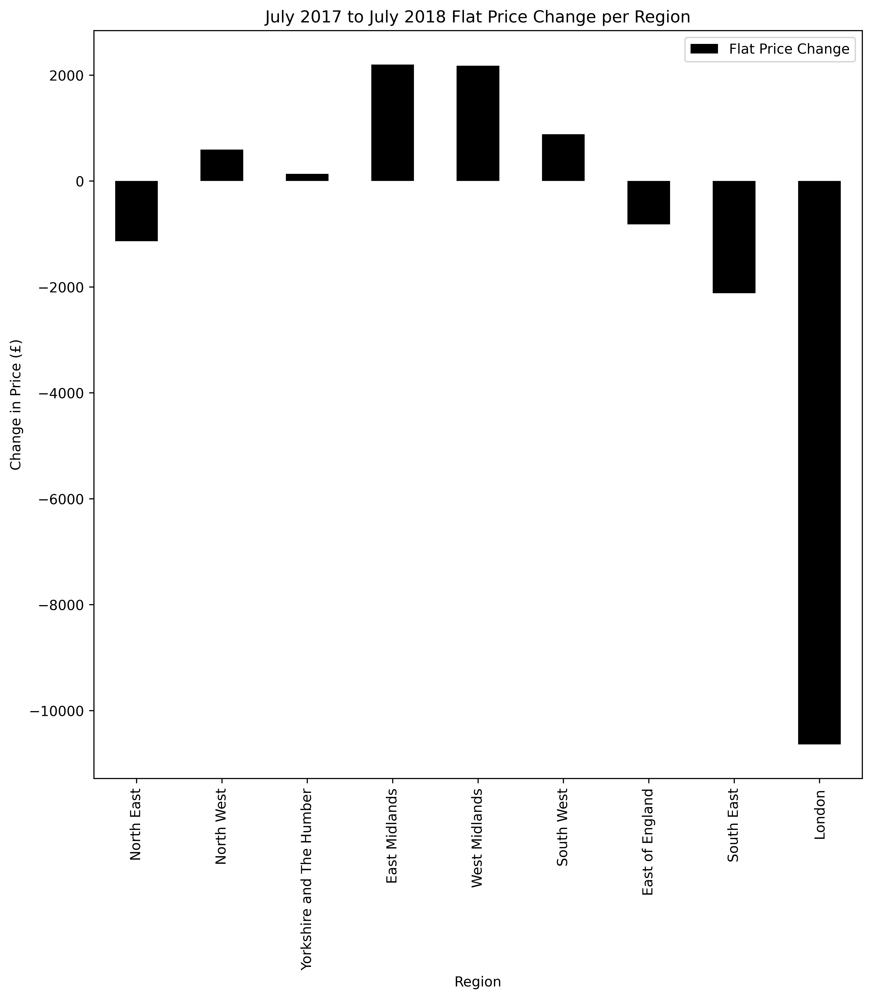

In [28]:
difference_region = houses_difference.groupby('Region', dropna=True).agg({'Flat Price Change': 'mean'}).reset_index()

print("Figure 14: Bars showing average change in price July 2017 to July 2018 per region")
fig, (a1) =  plt.subplots(1,1, dpi=600, figsize=(10,10))
difference_region.plot(kind="bar", x="Region", color="black", ax=a1)
a1.set_xlabel("Region")
a1.set_title("July 2017 to July 2018 Flat Price Change per Region")
a1.set_ylabel("Change in Price (£)")

Figure 14 shows that London flat prices reduced on mean average by over £10,000 but the Midlands increased by ~£2000. Yorkshire and the Humber showed the lowest change.
#### 4. B. b. Per Area

Figure 15: Showing average change in price July 2017 to July 2018 per area


Text(0, 0.5, 'Change in Price (£)')

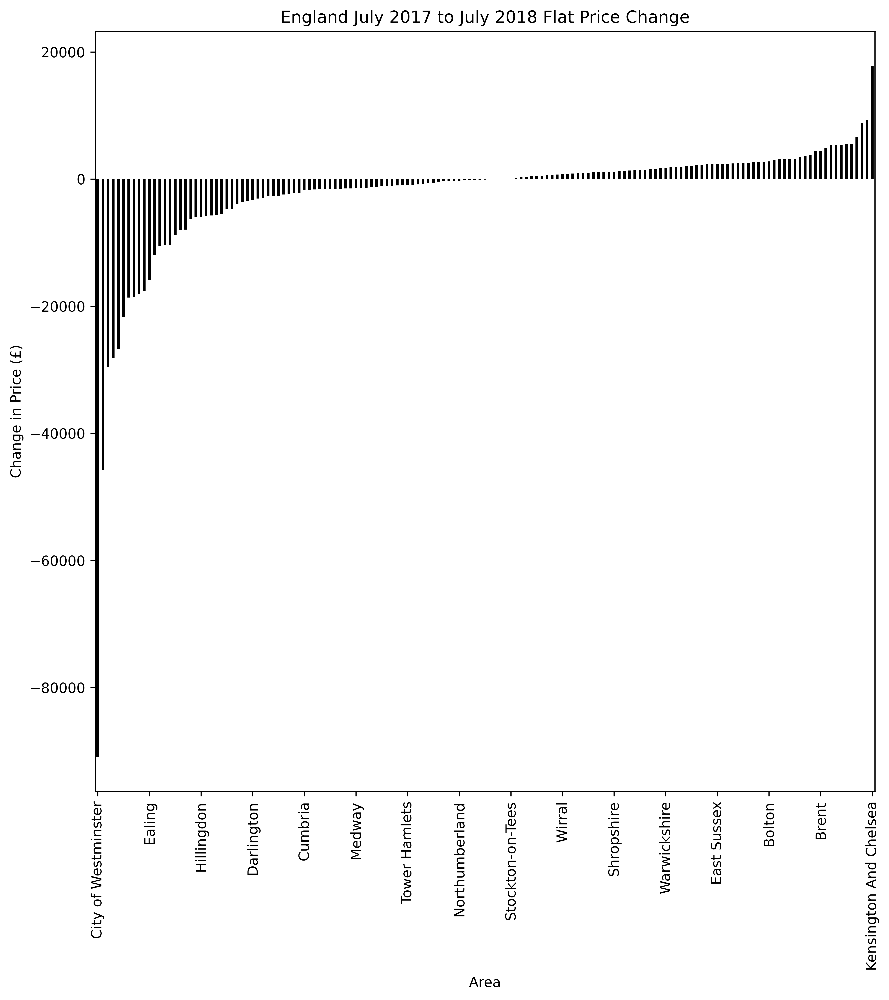

In [29]:
print("Figure 15: Showing average change in price July 2017 to July 2018 per area")
houses_difference_sorted = houses_difference.sort_values(by=('Flat Price Change'))
selected=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150]
xlist = houses_difference_sorted.iloc[selected, 1].to_list()

fig, (a1) =  plt.subplots(1,1, dpi=600, figsize=(10,10))
houses_difference_sorted.plot(kind="bar", x="Region", color="black", legend=False, ax=a1)
a1.set_xlabel("Area")
a1.set_xticks(selected)
a1.set_xticklabels(xlist)
a1.set_title("England July 2017 to July 2018 Flat Price Change")
a1.set_ylabel("Change in Price (£)")

Figure 15 shows every area in the country, however, I have only selected a few areas for ease of viewing. Notice how the highest reduction and increase are both areas of the London Region (City of Westminster and Kensington and Chelsea). It seems like there were many areas with large changes, with larger overall reductions than increases.

#### 4. B. c. Spread of Changes

In [30]:
print("Table 14: Changes less than 2000")
less_2000 = houses_difference_sorted.loc[(houses_difference_sorted['Flat Price Change'] < 2000) & (houses_difference_sorted['Flat Price Change'] > -2000)]
less_2000

Table 14: Changes less than 2000


,Region,Area,Flat Price Change
126,North West,Cumbria,-1712.06300
149,South East,West Sussex,-1711.65960
13,Yorkshire and The Humber,York,-1642.49820
56,North West,Bury,-1593.40920
10,Yorkshire and The Humber,East Riding of Yorkshire,-1583.76039
...,...,...,...
42,South East,Brighton and Hove,1759.16450
148,West Midlands,Warwickshire,1793.77060
142,East Midlands,Nottinghamshire,1906.16970
52,East of England,Bedford,1934.74390


Table 14 shows only those areas changing less than £2000. We can see there are 74 areas with such values, which is nearly half of all areas, implying that changes are disproportionate across England. The next figure shows this spread.

Figure 16: Histogram of the spread of Flat Price changes


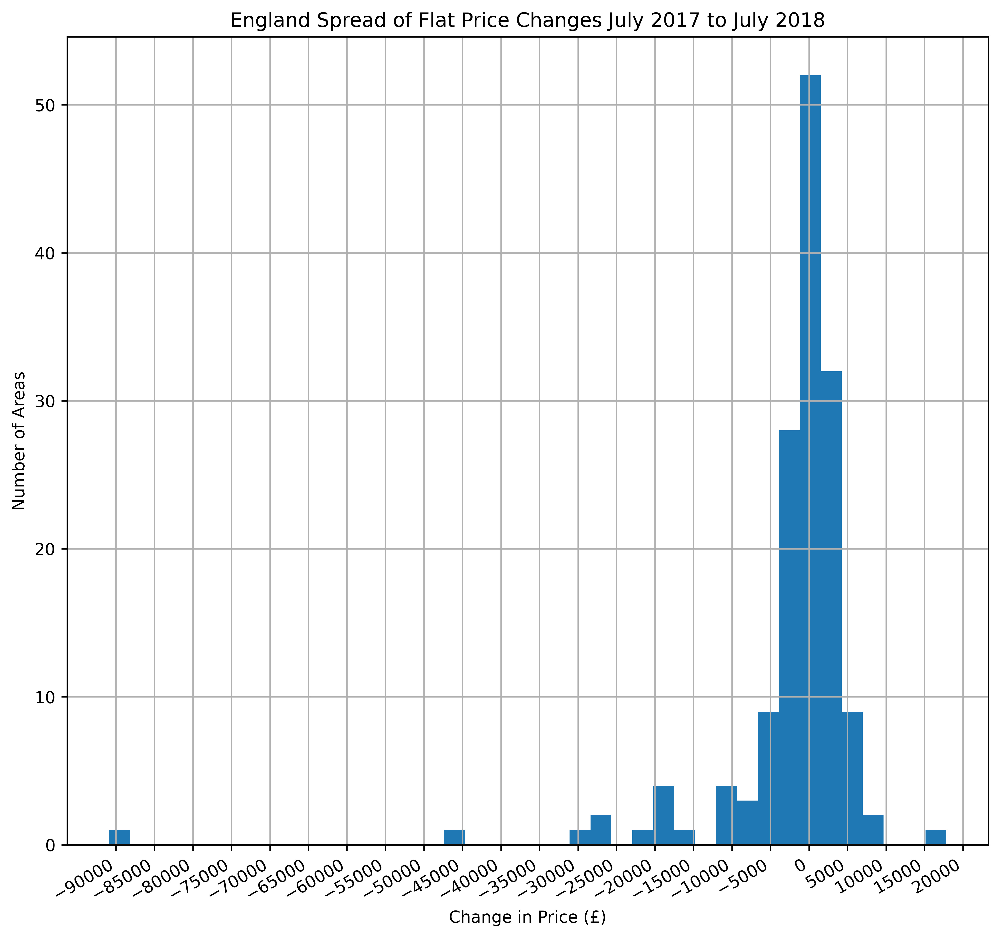

In [31]:
import numpy as np
print("Figure 16: Histogram of the spread of Flat Price changes")

fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,10))
houses_difference.hist(column="Flat Price Change", bins=40, ax=a1)

a1.set_xticks(np.arange(-90000, 20001, 5000))
a1.set_title("England Spread of Flat Price Changes July 2017 to July 2018")
a1.set_xlabel("Change in Price (£)")
a1.set_ylabel("Number of Areas")

fig.autofmt_xdate()

In [32]:
print("Table 15: Statistical summary of the spread of differences")
houses_difference.describe()

Table 15: Statistical summary of the spread of differences


,Flat Price Change
count,151.000000
mean,-2217.196037
std,10373.631559
min,-90900.293500
25%,-2297.152850
50%,-70.571400
75%,1934.917500
max,17836.137000


There are 151 areas in total. The histogram (Figure 16) shows that over half of the areas changed within +-£10000, with a handful exceeding this. Nearly half of all areas have less than £2000 difference which can be seen from the 25-75% range of Table 15.

Figure 17: Boxplot of the spread of Flat Price changes per region


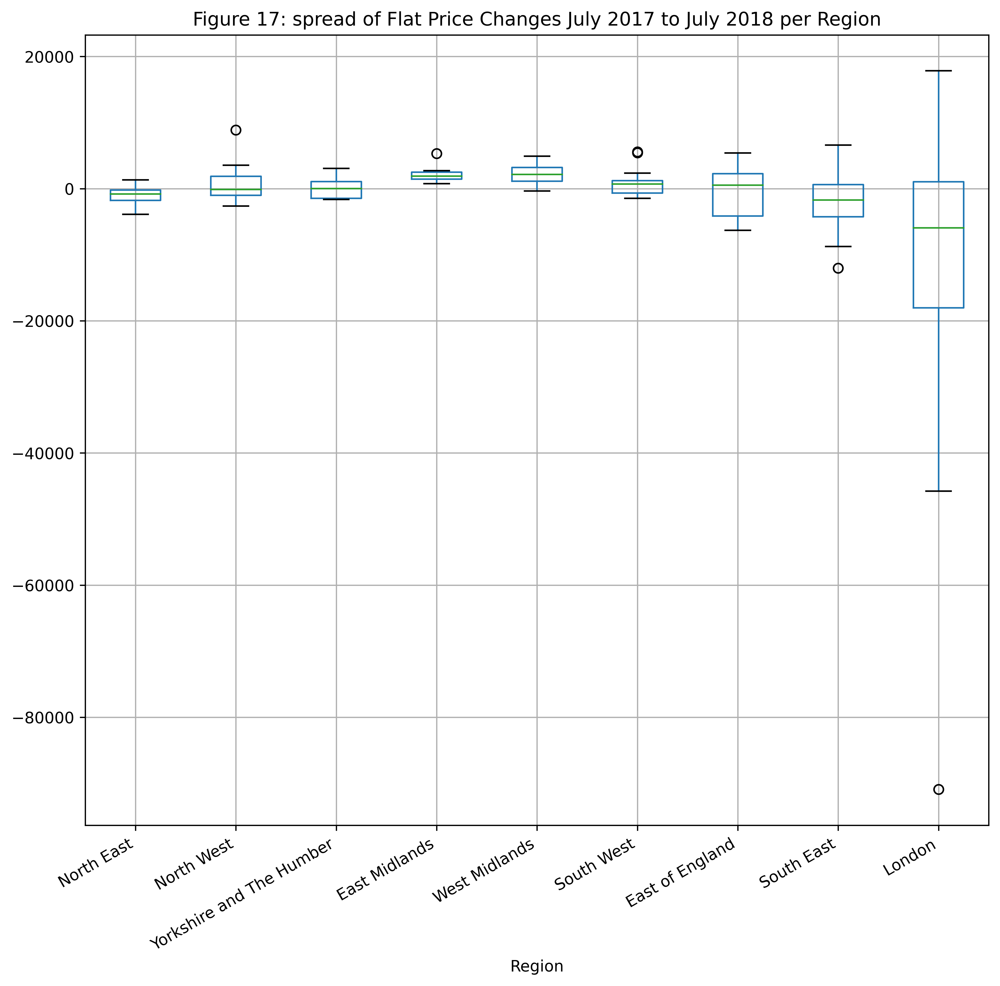

In [33]:
print("Figure 17: Boxplot of the spread of Flat Price changes per region")
fig, (a1) = plt.subplots(1,1, dpi=600, figsize=(10,10))
houses_difference.boxplot(column='Flat Price Change', by='Region', ax=a1)
fig.suptitle('')

a1.set_title("Figure 17: spread of Flat Price Changes July 2017 to July 2018 per Region")
fig.autofmt_xdate()

It is visible (Figure 17) that London is spread over both decrease and increase extremes. The East Midlands area prices are all increased, with the West Midlands similar, but more spread. Other regions vary but the south east tends towards price reduction with 75% of its values being low or negative.

Figure 18: Bars showing average change in price July 2017 to July 2018 per London Area


Text(0, 0.5, 'Change in Price (£)')

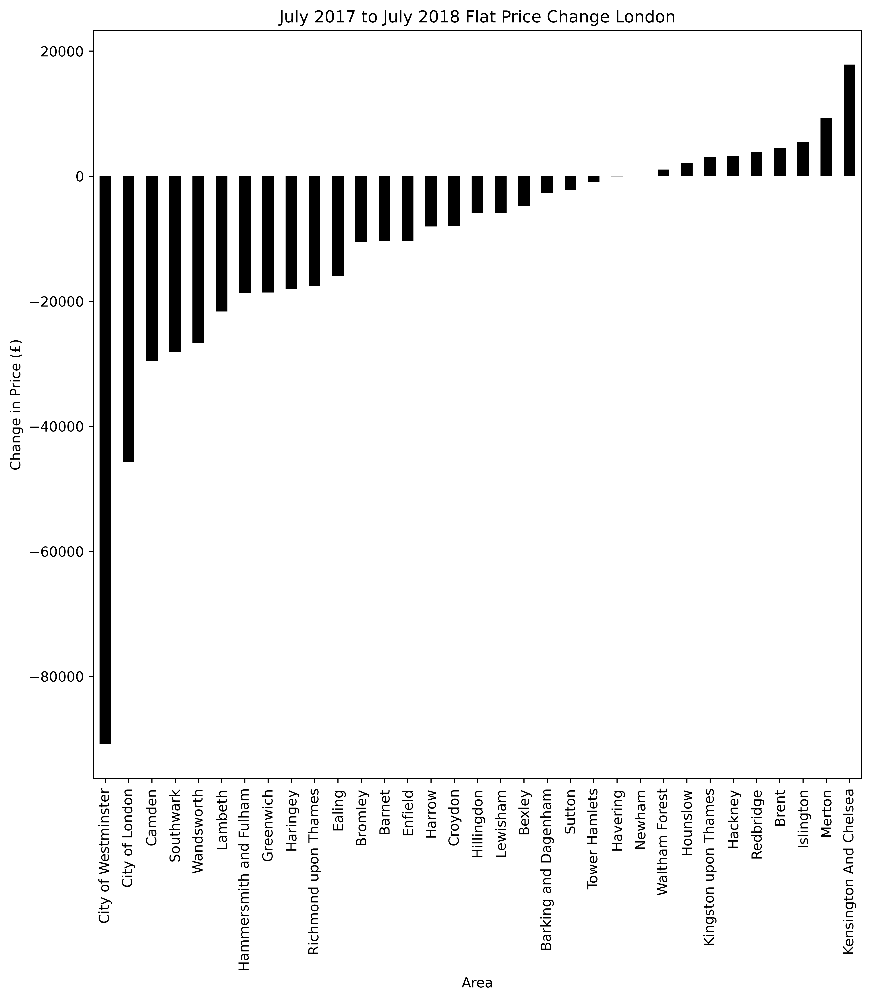

In [34]:
print("Figure 18: Bars showing average change in price July 2017 to July 2018 per London Area")
gbyDif = houses_difference_sorted.groupby('Region')

lond = gbyDif.get_group('London')

fig, (a1) =  plt.subplots(1,1, dpi=600, figsize=(10,10))
lond.plot(kind="bar", x="Area", color="black", legend=False, ax=a1)
a1.set_xlabel("Area")
a1.set_title("July 2017 to July 2018 Flat Price Change London")
a1.set_ylabel("Change in Price (£)")

Figure 18 visualises the large spread of London more closely. We can see that the City of Westminster has the largest flat price reduction, followed by the City of London. It seems that more London areas have reduced Flat prices than there are areas with an increase. Newham has the smallest change but Kensington and Chelsea have the largest increase.

In [35]:
north_east = gbyDif.get_group('North East')
north_west = gbyDif.get_group('North West')
york = gbyDif.get_group('Yorkshire and The Humber')
east_mid = gbyDif.get_group('East Midlands')
west_mid = gbyDif.get_group('West Midlands')
east_eng = gbyDif.get_group('East of England')
south_east = gbyDif.get_group('South East')
south_west = gbyDif.get_group('South West')

In [36]:
print("Figure 19: Bars showing average change in price July 2017 to July 2018 per Region per Area")
fig, ((a1,a2),(a3,a4),(a5,a6),(a7,a8)) =  plt.subplots(4,2, dpi=600, figsize=(10,30))
fig.suptitle("England July 2017 to July 2018 Flat Price Change",  y=0.99, x=0.55)
north_east.plot(kind="bar", x="Area", color="red", legend=False, xlabel='', ax=a1)
a1.set_title("North East")
a1.set_ylabel("Change in Price (£)")

north_west.plot(kind="bar", x="Area", color="darkblue", legend=False, xlabel='', ax=a2)
a2.set_title("North West")

york.plot(kind="bar", x="Area", color="olivedrab", legend=False, xlabel='', ax=a3)
a3.set_title("Yorkshire and the Humber")
a3.set_ylabel("Change in Price (£)")

east_mid.plot(kind="bar", x="Area", color="purple", legend=False, xlabel='', ax=a4)
a4.set_title("East Midlands")

west_mid.plot(kind="bar", x="Area", color="darkorange", legend=False, xlabel='', ax=a5)
a5.set_title("West Midlands")
a5.set_ylabel("Change in Price (£)")

east_eng.plot(kind="bar", x="Area", color="teal", legend=False, xlabel='', ax=a6)
a6.set_title("East England")

south_east.plot(kind="bar", x="Area", color="peru", legend=False, ax=a7)
a7.set_title("South East")
a7.set_xlabel("Area")
a7.set_ylabel("Change in Price (£)")

south_west.plot(kind="bar", x="Area", color="crimson", legend=False, ax=a8)
a8.set_title("South West")
a8.set_xlabel("Area")

fig.tight_layout()

Figure 19: Bars showing average change in price July 2017 to July 2018 per Region per Area


It can be seen from Figure 19 that the largest price increase in each region are South Syneside, Manchester, Sheffield, Leicester, Sandwell, Thurrock, Slough, Bournemouth. All of the East Midlands areas have increased in price, Leicester increasing the most by over £5000.

### 4. C. Area Flat Price Change Summary
Between July 2017 and July 2018
* London prices decreased the most on average, but this does not represent all areas of london. Two London areas showed the biggest increase and biggest decrease in the entire country.
* Most areas approximately changed ~+-£20,000, with nearly 50% only changing by +-£2000.
* All areas in the East and West Midlands increased in price (apart from Stoke-on-Trent).
* Nine out of twelve areas in the North East have reduced in price.

## 5. Price Change Analysis
Regions have different factors and numbers of areas which could affect price, nonetheless, this section will explore evidence to suggest if there is a significant difference between regions. I will be using Chi-squared to evaluate this. 
### 5. A. Cross-tabulation
First, it is required to change the value of negative or positive to 'Increase' or 'Decrease' so that we can count the areas of either in each region.

In [37]:
print("Table 16: Increase or decrease Flat price per area per region July 2017-July 2018")

def up_down(row):
    if row.loc["Flat Price Change"] > 0:
        return "Increase"
    elif row.loc["Flat Price Change"] < 0:
        return "Decrease"
    else:
        return "No"
    
houses_difference_cat = houses_difference.assign(UpDown = houses_difference.apply(up_down, axis=1))
houses_difference_cat = houses_difference_cat.drop(labels=['Area', 'Flat Price Change'], axis=1)
houses_difference_cat

Table 16: Increase or decrease Flat price per area per region July 2017-July 2018


,Region,UpDown
0,North East,Decrease
1,North East,Increase
2,North East,Decrease
3,North East,Increase
4,North East,Decrease
...,...,...
146,East of England,Increase
147,South East,Decrease
148,West Midlands,Increase
149,South East,Decrease


In [38]:
print("Table 17: Count of flat price change per region")
region_and_change = pd.crosstab(houses_difference_cat.UpDown, [houses_difference_cat.Region])
region_and_change

Table 17: Count of flat price change per region


Region,North East,North West,Yorkshire and The Humber,East Midlands,West Midlands,South West,East of England,South East,London
UpDown,,,,,,,,,
Decrease,9,12,7,0,2,6,5,13,23
Increase,3,11,8,9,12,9,6,6,10


### 5. B. Chi-Squared

In [39]:
import scipy.stats as stats
print("Table 18: Differences between actual change counts and the expected")
test_stat, p_value, dof, expected = stats.chi2_contingency(region_and_change, correction=False)
region_and_change - expected.round(1)

Table 18: Differences between actual change counts and the expected


Region,North East,North West,Yorkshire and The Humber,East Midlands,West Midlands,South West,East of England,South East,London
UpDown,,,,,,,,,
Decrease,2.9,0.3,-0.6,-4.6,-5.1,-1.6,-0.6,3.3,6.2
Increase,-2.9,-0.3,0.6,4.6,5.1,1.6,0.6,-3.3,-6.2


The expected values would be an equal amount of increase and decrease areas per region. If the actual is different from the expected, then it could suggest that the regions affect if areas increase or decrease. We can see (Table 18) that the most-spread Regions over increase and decrease, like London, have the largest difference from the expected values. For this test, the alpha will be set to 5%, this is a threshold for which I will conclude a statistical significance. Effectively, it means I am willing to allow the null hypothesis to be incorrectly rejected 5% of the time.

In [40]:
print('The chi-squared test statistic is %4.2f' % test_stat)
print('The p-value is %4.3f %%' % (100 * p_value))

The chi-squared test statistic is 27.60
The p-value is 0.056 %


Overall, the chi-squared test gives an overall result of 27.60, which gives the p-value of 0.056%.  Because the p-value is less than 5%, I conclude that the change in price is dependent on the region.
However, the test does not display the kind of relationship between Change and Region.

## 6. Conclusion
* The North East Detached and Flat prices are the less expensive than other regions of England.
* Detached prices usually peak later than Flats.
* Nearly 50% of all Flats only changed by +-£2000 from July 2017 to July 2018.
* All areas from July 2017 to July 2018 in the East Midlands increased in Flat price.
* The change in price and region are related.

This information would need to be repeated for other years to justify any trends. However, if you were to use this information to make a purchase decision, depending on your preferences, you could do the following:
- Purchase Flats in the Midlands, if you want a property that will increase in value, especially Leicester.
- In London, Flats in Westminster reduced the most, do not buy here if you are looking for investment, buy in Kensington or Chelsea instead.
- Purchase properties in the North East, if you are on a budget.